<a href="https://colab.research.google.com/github/Prajwalng2/DL-Project/blob/main/DL_Image_captioning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os
import sys
from tempfile import NamedTemporaryFile
from urllib.request import urlopen
from urllib.parse import unquote, urlparse
from urllib.error import HTTPError
from zipfile import ZipFile
import tarfile
import shutil

CHUNK_SIZE = 40960
DATA_SOURCE_MAPPING = 'flickr8k:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F623289%2F1111676%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240609%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240609T074202Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D9e2273207efa08d4e9791b1744bf76945a2997f931bc4fc22fd8d68d9fc16d41e074644700f7bcc2207a1fc6824668d1eb92e1cf9371e72ead8677d0f7cd3ecea188dbcf2b2f6bc1f1f833f962b8251eba4eba0f567cb6d2499ee9291cb4a005407a41d674e10ef6ff570f283c1ca6a0b1758ebdca99f327c5e6e91dfa343cabbdcf290c607c22701e1f414ef7677a982772b95f176ecbff10a243362850c8c6b740d3ae6d915543f766182d90403b62de862d224c3f9e224c556cc79d07a792ce73e2894116496553c81690d36757217c1a9c00535c7d6f0f019cb29750727580adde0699bd4666f5eb7130c564d5b661f40ae31b26cfb434dd09e227834eb4,flickr8k-text:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F885788%2F1504750%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240609%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240609T074202Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D22930d884301318491dcaac9a0c166044feb7c6e7b7f94f15139467c91dbc1068ce6e096cafc14b3dc47703099d14fb7bb5d2beccb15aa26365a21fa537730ef6e4f2f00986701a83d99a4539480468b9611864f599ec2316e1d6946aed6a4f0aa3e07a3a6fbf060c12ee30166559a0745986a7302ac37b633174cfb8c01589c6dfbdf964bad632f123dab8165ed47280f145c67936a2cea4a62c48ac00bcbba5760044af654935b785ab5f5e7435a92d191679a2dc2c658134521f31eb0f6e41fc4a1cdf7db8c82cd4a806f3e6795091dcec9ebf57d94ee633c3b255a9dec821dd792c36d5cbc5b1c68d5958c91941352fd92cdae78ecb596692ba6613f65b2'

KAGGLE_INPUT_PATH='/kaggle/input'
KAGGLE_WORKING_PATH='/kaggle/working'
KAGGLE_SYMLINK='kaggle'

!umount /kaggle/input/ 2> /dev/null
shutil.rmtree('/kaggle/input', ignore_errors=True)
os.makedirs(KAGGLE_INPUT_PATH, 0o777, exist_ok=True)
os.makedirs(KAGGLE_WORKING_PATH, 0o777, exist_ok=True)

try:
  os.symlink(KAGGLE_INPUT_PATH, os.path.join("..", 'input'), target_is_directory=True)
except FileExistsError:
  pass
try:
  os.symlink(KAGGLE_WORKING_PATH, os.path.join("..", 'working'), target_is_directory=True)
except FileExistsError:
  pass

for data_source_mapping in DATA_SOURCE_MAPPING.split(','):
    directory, download_url_encoded = data_source_mapping.split(':')
    download_url = unquote(download_url_encoded)
    filename = urlparse(download_url).path
    destination_path = os.path.join(KAGGLE_INPUT_PATH, directory)
    try:
        with urlopen(download_url) as fileres, NamedTemporaryFile() as tfile:
            total_length = fileres.headers['content-length']
            print(f'Downloading {directory}, {total_length} bytes compressed')
            dl = 0
            data = fileres.read(CHUNK_SIZE)
            while len(data) > 0:
                dl += len(data)
                tfile.write(data)
                done = int(50 * dl / int(total_length))
                sys.stdout.write(f"\r[{'=' * done}{' ' * (50-done)}] {dl} bytes downloaded")
                sys.stdout.flush()
                data = fileres.read(CHUNK_SIZE)
            if filename.endswith('.zip'):
              with ZipFile(tfile) as zfile:
                zfile.extractall(destination_path)
            else:
              with tarfile.open(tfile.name) as tarfile:
                tarfile.extractall(destination_path)
            print(f'\nDownloaded and uncompressed: {directory}')
    except HTTPError as e:
        print(f'Failed to load (likely expired) {download_url} to path {destination_path}')
        continue
    except OSError as e:
        print(f'Failed to load {download_url} to path {destination_path}')
        continue

print('Data source import complete.')


[==================================================] 1112971163 bytes downloaded
Downloaded and uncompressed: flickr8k
[==================================================] 1796559 bytes downloaded
Downloaded and uncompressed: flickr8k-text
Data source import complete.


In [ ]:
import matplotlib.pyplot as plt
import tensorflow as tf
from keras.models import Sequential
from tensorflow.compat.v1.keras.backend import set_session
import keras
import sys, time, os, warnings
import numpy as np
import pandas as pd
from collections import Counter
warnings.filterwarnings('ignore')

In [ ]:
config = tf.compat.v1.ConfigProto()
config.gpu_options.per_process_gpu_memory_fraction = 0.95
config.gpu_options.visible_device_list = "0"
set_session(tf.compat.v1.Session(config=config))

def set_seed(sd=8):
    from numpy.random import seed
    from tensorflow import set_random_seed
    import random as rn

    seed(sd)
    rn.seed(sd)
    set_random_seed(sd)

In [ ]:
dir_Flickr_jpg = "../input/flickr8k/Images"

dir_Flickr_text = "../input/flickr8k-text/Flickr8k.token.txt"

jpgs = os.listdir(dir_Flickr_jpg)
print("The number of jpg flies in Flicker8k: {}".format(len(jpgs)))

The number of jpg flies in Flicker8k: 8091


In [ ]:
file = open(dir_Flickr_text,'r', encoding='utf8')
text = file.read()
file.close()


datatxt = []
for line in text.split('\n'):
    col = line.split('\t')
    if len(col) == 1:
        continue
    w = col[0].split("#")
    datatxt.append(w + [col[1].lower()])

df_txt = pd.DataFrame(datatxt,columns=["filename","index","caption"])


uni_filenames = np.unique(df_txt.filename.values)
print("The number of unique file names : {}".format(len(uni_filenames)))
print("The distribution of the number of captions for each image:")
Counter(Counter(df_txt.filename.values).values())
print(df_txt[:5])

The number of unique file names : 8092
The distribution of the number of captions for each image:
                    filename index  \
0  1000268201_693b08cb0e.jpg     0   
1  1000268201_693b08cb0e.jpg     1   
2  1000268201_693b08cb0e.jpg     2   
3  1000268201_693b08cb0e.jpg     3   
4  1000268201_693b08cb0e.jpg     4   

                                             caption  
0  a child in a pink dress is climbing up a set o...  
1              a girl going into a wooden building .  
2   a little girl climbing into a wooden playhouse .  
3  a little girl climbing the stairs to her playh...  
4  a little girl in a pink dress going into a woo...  


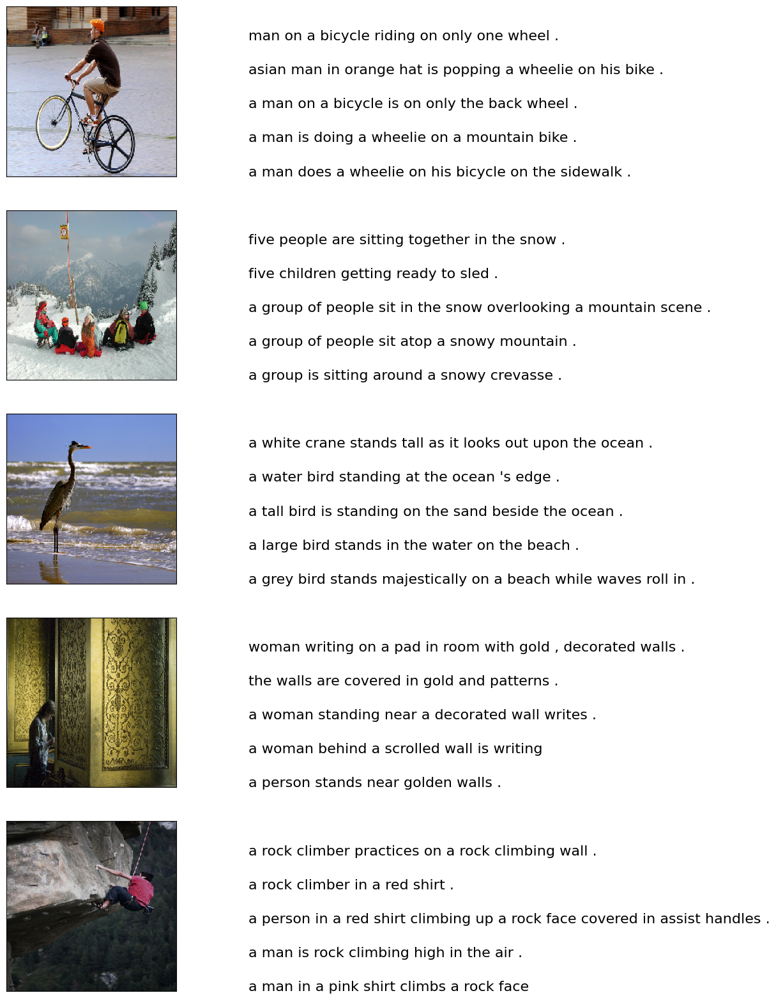

In [ ]:
from keras.preprocessing.image import load_img, img_to_array
from IPython.display import display
from PIL import Image

npic = 5
npix = 224
target_size = (npix, npix, 3)

count = 1
fig = plt.figure(figsize=(10,20))

for jpgfnm in uni_filenames[-5:]:
    filename = dir_Flickr_jpg + '/' + jpgfnm
    captions = list(df_txt["caption"].loc[df_txt["filename"]==jpgfnm].values)
    image_load = load_img(filename, target_size=target_size)

    ax = fig.add_subplot(npic, 2, count, xticks=[], yticks=[])
    ax.imshow(image_load)
    count += 1

    ax = fig.add_subplot(npic, 2 , count)
    plt.axis('off')
    ax.plot()
    ax.set_xlim(0,1)
    ax.set_ylim(0, len(captions))
    for i, caption in enumerate(captions):
        ax.text(0, i, caption, fontsize=16)
    count += 1
plt.show()

In [ ]:
def df_word(df_txt):
    vocabulary = []
    for txt in df_txt.caption.values:
        vocabulary.extend(txt.split())
    print('Vocabulary Size: %d' % len(set(vocabulary)))
    ct = Counter(vocabulary)
    dfword = pd.DataFrame({'word':list(ct.keys()), "count":list(ct.values())})
    dfword = dfword.sort_values("count", ascending=False)
    dfword = dfword.reset_index()[["word", "count"]]

    return (dfword)

dfword = df_word(df_txt)
dfword.head()

Vocabulary Size: 8918


,word,count
0,a,62989
1,.,36581
2,in,18975
3,the,18419
4,on,10744


In [ ]:
import string
text_original = "I ate 8 burgers and 4 pizzas. it's 9:44 am. can you play chess with me"

print("Origial sentense: ",text_original)
print("\nRemoving Punctuations...")


def remove_punctuation(text_original):
    text_without_punct = text_original.translate(str.maketrans('','',string.punctuation))
    return text_without_punct

text_without_punct = remove_punctuation(text_original)
print(text_without_punct)

print("\nRemoving a single character...")


def removing_single_char(text):
    text_len_greater_than_one = ""
    for word in text.split():
        if len(word) > 1:
            text_len_greater_than_one += " " + word
    return text_len_greater_than_one

text_len_greater_than_one = removing_single_char(text_without_punct)
print(text_len_greater_than_one)

print("\nRemoving numeric values...")

def remove_numeric(text, printTF=False):
    text_without_num = ""
    for word in text.split():
        isalpha = word.isalpha()
        if printTF:
            print("     {:10} : {:}".format(word, isalpha))
        if isalpha:
            text_without_num += " "+ word
    return text_without_num

text_without_num = remove_numeric(text_len_greater_than_one, printTF=True)
print(text_without_num)

Origial sentense:  I ate 8 burgers and 4 pizzas. it's 9:44 am. can you play chess with me

Removing Punctuations...
I ate 8 burgers and 4 pizzas its 944 am can you play chess with me

Removing a single character...
 ate burgers and pizzas its 944 am can you play chess with me

Removing numeric values...
     ate        : True
     burgers    : True
     and        : True
     pizzas     : True
     its        : True
     944        : False
     am         : True
     can        : True
     you        : True
     play       : True
     chess      : True
     with       : True
     me         : True
 ate burgers and pizzas its am can you play chess with me


In [ ]:
def text_clean(text_original):

    text = remove_punctuation(text_original)
    text = removing_single_char(text)
    text = remove_numeric(text)

    return text

for i, caption in enumerate(df_txt.caption.values):
    newcaption = text_clean(caption)
    df_txt['caption'].iloc[i] = newcaption

Vocabulary Size: 8763


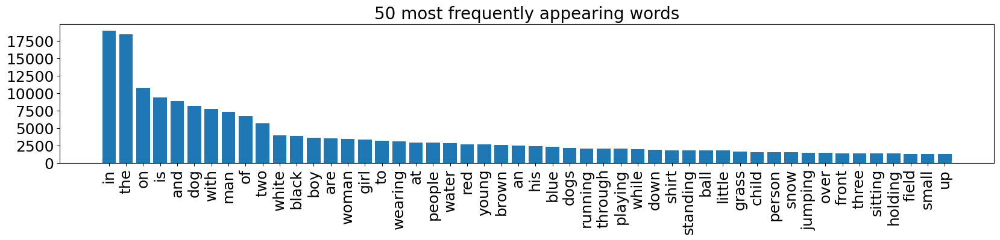

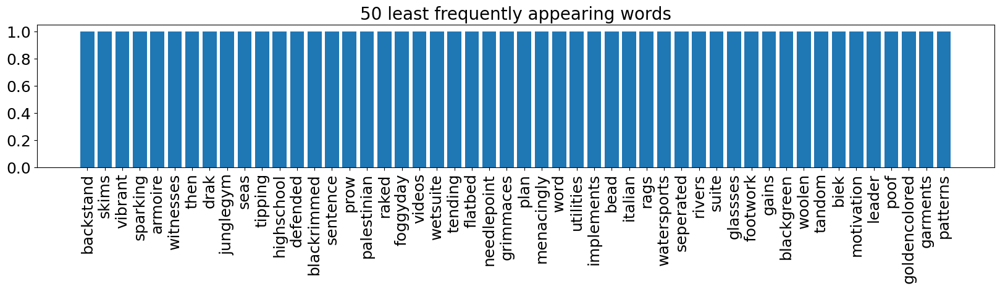

In [ ]:
topn = 50

def plthist(dfsub, title="Plotting top 50 words that occur in the Cleaned Dataset"):
    plt.figure(figsize=(20,3))
    plt.bar(dfsub.index, dfsub["count"])
    plt.yticks(fontsize=18)
    plt.xticks(dfsub.index, dfsub["word"], rotation=90, fontsize=18)
    plt.title(title, fontsize=20)
    plt.show()

dfword = df_word(df_txt)
plthist(dfword.iloc[:topn,:], title="50 most frequently appearing words")
plthist(dfword.iloc[-topn:,:], title="50 least frequently appearing words")

In [ ]:
from copy import copy
def add_tokens(captions):
    caps = []
    for txt in captions:
        txt = "startseq" + txt + " endseq"
        caps.append(txt)
    return caps
df_txt0 = copy(df_txt)
df_txt0["caption"] = add_tokens(df_txt["caption"])
df_txt0.head(5)

,filename,index,caption
0,1000268201_693b08cb0e.jpg,0,startseq child in pink dress is climbing up se...
1,1000268201_693b08cb0e.jpg,1,startseq girl going into wooden building endseq
2,1000268201_693b08cb0e.jpg,2,startseq little girl climbing into wooden play...
3,1000268201_693b08cb0e.jpg,3,startseq little girl climbing the stairs to he...
4,1000268201_693b08cb0e.jpg,4,startseq little girl in pink dress going into ...


In [ ]:
from keras.applications import VGG16

model_vgg = VGG16(include_top=True, weights='imagenet')
model_vgg.summary()


553467096/553467096 [==============================] - 7s 0us/step
Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                            

In [ ]:
from keras import models
model = Sequential()
for layer in model_vgg.layers[:-1]:
    model.add(layer)
final_vgg_model = models.Model(inputs=model.inputs, outputs=model.layers[-1].output)

final_vgg_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [ ]:
from keras.preprocessing.image import load_img,  img_to_array
from keras.applications.vgg16 import preprocess_input
from collections import OrderedDict

images = OrderedDict()
npix = 224
target_size = (npix, npix, 3)
data = np.zeros((len(jpgs), npix, npix, 3))
for i, name in enumerate(jpgs):
    filename = dir_Flickr_jpg + '/' + name
    image = load_img(filename, target_size=target_size)
    image = img_to_array(image)
    nimage = preprocess_input(image)

    y_pred = final_vgg_model.predict(nimage.reshape((1,)+ nimage.shape[:3]))
    images[name] = y_pred.flatten()

Streaming output truncated to the last 5000 lines.
1/1 [==============================] - 0s 21ms/step


In [ ]:
from sklearn.decomposition import PCA

encoder = np.array(list(images.values()))

pca = PCA(n_components=2)

y_pca = pca.fit_transform(encoder)

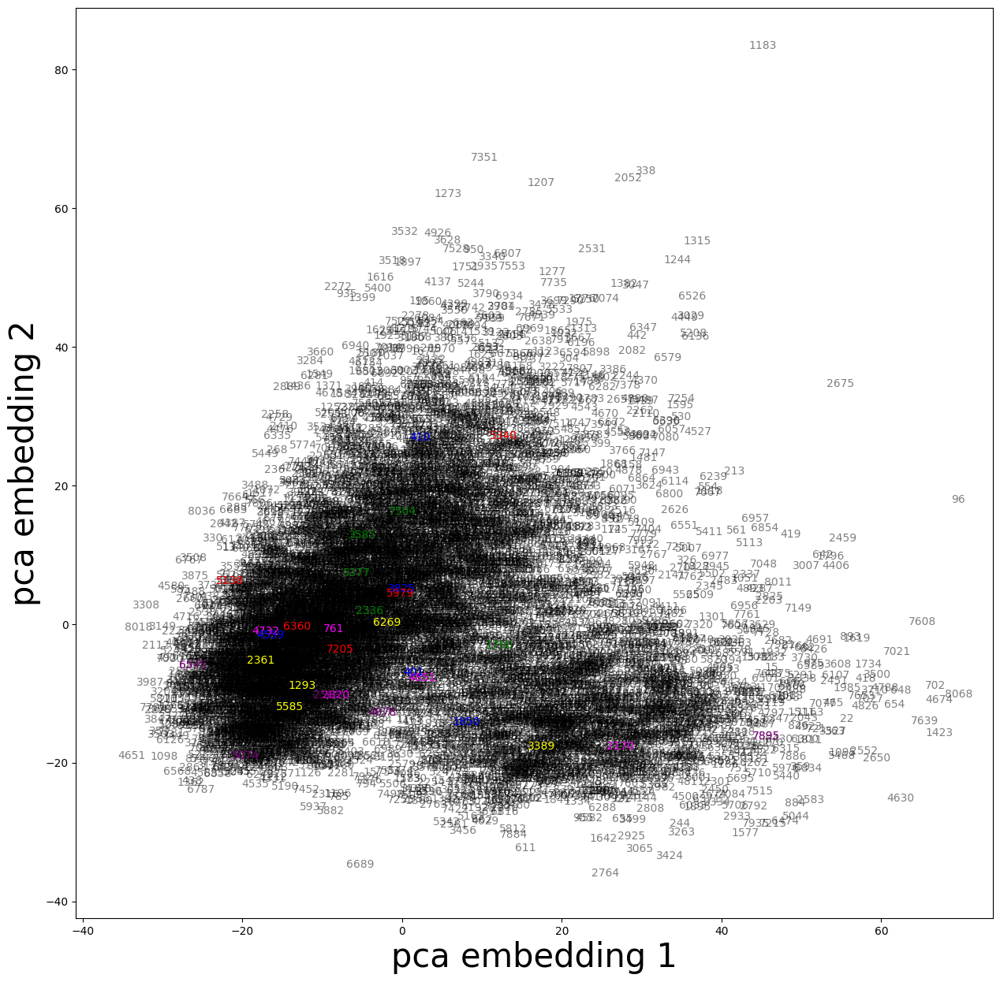

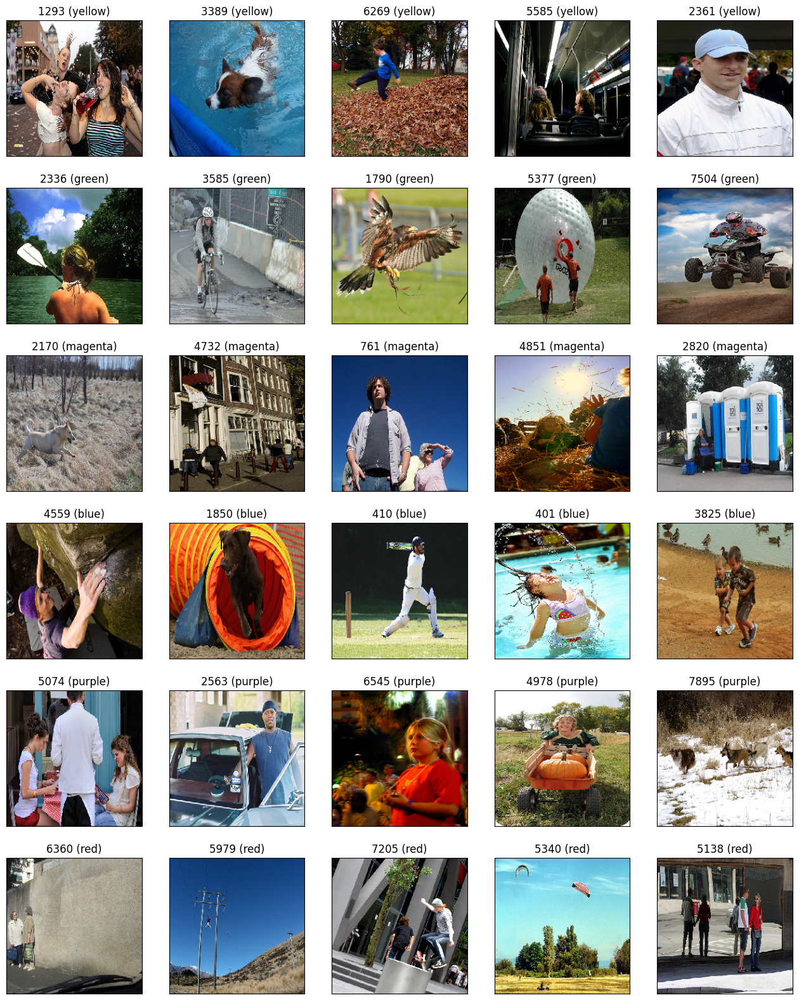

In [ ]:
picked_picture = OrderedDict()
picked_picture["yellow"] = [1293, 3389, 6269, 5585, 2361]
picked_picture["green"] = [2336, 3585, 1790, 5377, 7504]
picked_picture["magenta"] = [2170, 4732, 761, 4851, 2820]
picked_picture["blue"] = [4559, 1850, 410, 401, 3825]
picked_picture["purple"] = [5074, 2563, 6545, 4978, 7895]
picked_picture["red"] = [6360, 5979, 7205, 5340, 5138]

fig, ax = plt.subplots(figsize=(15,15))
ax.scatter(y_pca[:,0], y_pca[:,1], c="white")

for irow in range(y_pca.shape[0]):
    ax.annotate(irow, y_pca[irow,:], color="black", alpha=0.5)
for color, irows in picked_picture.items():
    for irow in irows:
        ax.annotate(irow, y_pca[irow, :], color=color)
ax.set_xlabel("pca embedding 1", fontsize=30)
ax.set_ylabel("pca embedding 2", fontsize=30)
plt.show()


fig = plt.figure(figsize=(16,20))
count = 1
for color, irows in picked_picture.items():
    for ivec in irows:
        name = jpgs[ivec]
        filename = dir_Flickr_jpg + '/' + name
        image = load_img(filename, target_size=target_size)
        ax = fig.add_subplot(len(picked_picture), 5, count, xticks=[], yticks=[])
        count += 1
        plt.imshow(image)
        plt.title("{} ({})".format(ivec, color))
plt.show()

In [ ]:
dimages, keepindex = [], []

df_txt0 = df_txt0.loc[df_txt0["index"].values == '0',:]

for i, fnm in enumerate(df_txt0.filename):
    if fnm in images.keys():
        dimages.append(images[fnm])
        keepindex.append(i)

fnames = df_txt0["filename"].iloc[keepindex].values

dcaptions = df_txt0["caption"] .iloc[keepindex].values

dimages = np.array(dimages)

In [ ]:
df_txt0.head()

,filename,index,caption
0,1000268201_693b08cb0e.jpg,0,startseq child in pink dress is climbing up se...
5,1001773457_577c3a7d70.jpg,0,startseq black dog and spotted dog are fightin...
10,1002674143_1b742ab4b8.jpg,0,startseq little girl covered in paint sits in ...
15,1003163366_44323f5815.jpg,0,startseq man lays on bench while his dog sits ...
20,1007129816_e794419615.jpg,0,startseq man in an orange hat starring at some...


In [ ]:
from keras.preprocessing.text import Tokenizer
nb_words = 6000
tokenizer = Tokenizer(nb_words=nb_words)
tokenizer.fit_on_texts(dcaptions)
vocab_size = len(tokenizer.word_index) + 1
print("Vocubulary size : {}".format(vocab_size))
dtexts = tokenizer.texts_to_sequences(dcaptions)
print(dtexts[:3])

Vocubulary size : 4476
[[1, 38, 3, 66, 144, 7, 124, 52, 406, 9, 367, 3, 24, 2351, 522, 2], [1, 12, 8, 5, 752, 8, 17, 368, 2], [1, 48, 15, 170, 3, 584, 101, 3, 41, 9, 551, 1198, 11, 55, 213, 3, 1076, 2]]


In [ ]:
prop_test, prop_val = 0.2, 0.2

N = len(dtexts)
Ntest, Nval = int(N*prop_test), int(N*prop_val)

def split_test_val_train(dtexts,Ntest,Nval):
    return(dtexts[:Ntest],
           dtexts[Ntest:Ntest+Nval],
           dtexts[Ntest+Nval:])

dt_test,  dt_val, dt_train   = split_test_val_train(dtexts,Ntest,Nval)
di_test,  di_val, di_train   = split_test_val_train(dimages,Ntest,Nval)
fnm_test,fnm_val, fnm_train  = split_test_val_train(fnames,Ntest,Nval)

In [ ]:
maxlen = np.max([len(text) for text in dtexts])
minlen = np.min([len(text) for text in dtexts])
print("Min length of caption: {} and Max length of caption: {}".format(minlen, maxlen))

Min length of caption: 2 and Max length of caption: 30


In [ ]:
from keras.preprocessing.sequence import pad_sequences
from keras.utils import to_categorical

def preprocessing(dtexts,dimages):
    N = len(dtexts)
    print("# captions/images = {}".format(N))

    assert(N==len(dimages))
    Xtext, Ximage, ytext = [],[],[]
    for text,image in zip(dtexts,dimages):

        for i in range(1,len(text)):
            in_text, out_text = text[:i], text[i]
            in_text = pad_sequences([in_text],maxlen=maxlen).flatten()
            out_text = to_categorical(out_text,num_classes = vocab_size)


            Xtext.append(in_text)
            Ximage.append(image)
            ytext.append(out_text)

    Xtext  = np.array(Xtext)
    Ximage = np.array(Ximage)
    ytext  = np.array(ytext)
    print(" {} {} {}".format(Xtext.shape,Ximage.shape,ytext.shape))
    return(Xtext,Ximage,ytext)


Xtext_train, Ximage_train, ytext_train = preprocessing(dt_train,di_train)
Xtext_val,   Ximage_val,   ytext_val   = preprocessing(dt_val,di_val)

# captions/images = 4855
 (49631, 30) (49631, 4096) (49631, 4476)
# captions/images = 1618
 (16353, 30) (16353, 4096) (16353, 4476)


In [ ]:
from keras import layers, models
from keras.layers import Input, Dense, Dropout, Embedding, LSTM
from keras.layers import LeakyReLU, PReLU

print(vocab_size)

dim_embedding = 64

input_image = layers.Input(shape=(Ximage_train.shape[1],))
fimage = layers.Dense(256, activation='relu', name="ImageFeature")(input_image)


input_txt = layers.Input(shape=(maxlen,))
ftxt = layers.Embedding(vocab_size, dim_embedding, mask_zero=True)(input_txt)
ftxt = layers.LSTM(256, name="CaptionFeature", return_sequences=True)(ftxt)

se2 = Dropout(0.04)(ftxt)
ftxt = layers.LSTM(256, name="CaptionFeature2")(se2)


decoder = layers.add([ftxt, fimage])
decoder = layers.Dense(256, activation="relu")(decoder)
output = layers.Dense(vocab_size, activation='softmax')(decoder)


model = models.Model(inputs=[input_image, input_txt], outputs=output)


model.compile(loss='categorical_crossentropy', optimizer='adam')

model.summary()


4476
Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_3 (InputLayer)        [(None, 30)]                 0         []                            
                                                                                                  
 embedding (Embedding)       (None, 30, 64)               286464    ['input_3[0][0]']             
                                                                                                  
 CaptionFeature (LSTM)       (None, 30, 256)              328704    ['embedding[0][0]']           
                                                                                                  
 dropout (Dropout)           (None, 30, 256)              0         ['CaptionFeature[0][0]']      
                                                                                       

In [ ]:
from time import time
from keras.callbacks import TensorBoard

tensorboard = TensorBoard(log_dir="log/{}".format(time()))

hist = model.fit([Ximage_train, Xtext_train], ytext_train, epochs=6, verbose=2, batch_size=32, validation_data=([Ximage_val, Xtext_val], ytext_val), callbacks=[tensorboard])

Epoch 1/6
1551/1551 - 256s - loss: 5.3819 - val_loss: 4.9498 - 256s/epoch - 165ms/step
Epoch 2/6
1551/1551 - 243s - loss: 4.5210 - val_loss: 4.6397 - 243s/epoch - 157ms/step
Epoch 3/6
1551/1551 - 235s - loss: 4.1196 - val_loss: 4.5220 - 235s/epoch - 152ms/step
Epoch 4/6
1551/1551 - 228s - loss: 3.8566 - val_loss: 4.5294 - 228s/epoch - 147ms/step
Epoch 5/6
1551/1551 - 223s - loss: 3.6569 - val_loss: 4.6112 - 223s/epoch - 144ms/step
Epoch 6/6
1551/1551 - 225s - loss: 3.4869 - val_loss: 4.6890 - 225s/epoch - 145ms/step


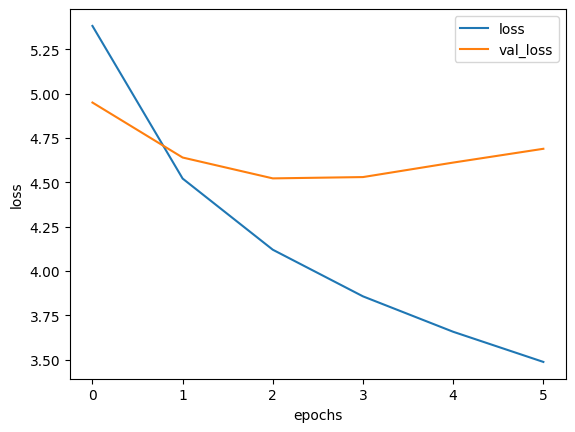

In [ ]:
for label in ["loss","val_loss"]:
    plt.plot(hist.history[label], label=label)
plt.legend()
plt.xlabel("epochs")
plt.ylabel("loss")
plt.show()

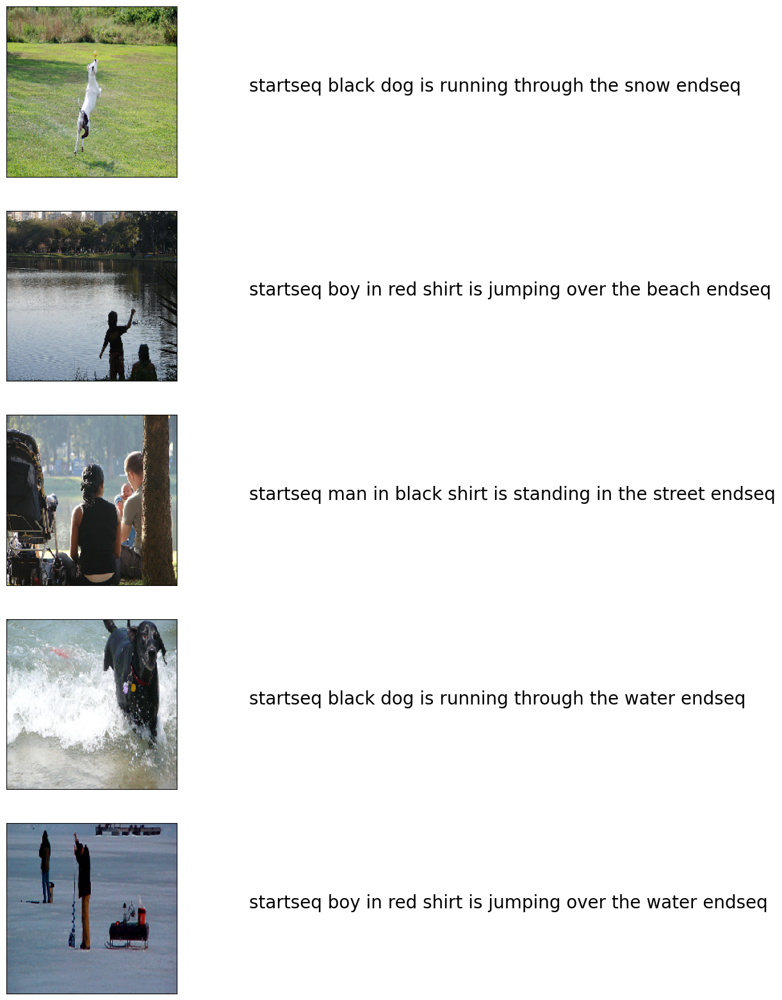

In [ ]:
index_word = dict([(index, word) for word, index in tokenizer.word_index.items()])

def predict_caption(image):

    in_text = 'startseq'

    for iword in range(maxlen):
        sequence = tokenizer.texts_to_sequences([in_text])[0]
        sequence = pad_sequences([sequence], maxlen)
        yhat = model.predict([image, sequence], verbose=0)
        yhat = np.argmax(yhat)
        newword = index_word[yhat]
        in_text += " "+ newword
        if newword == "endseq":
            break
    return in_text

npic = 5
npix = 224
target_size = (npix, npix, 3)
count = 1

fig = plt.figure(figsize=(10,20))

for jpgfnm, image_feature in zip(fnm_test[15:20], di_test[15:20]):

    filename = dir_Flickr_jpg + '/' + jpgfnm
    image_load = load_img(filename, target_size=target_size)
    ax = fig.add_subplot(npic, 2, count, xticks=[], yticks=[])
    ax.imshow(image_load)
    count += 1


    caption = predict_caption(image_feature.reshape(1, len(image_feature)))
    ax = fig.add_subplot(npic, 2, count)
    plt.axis('off')
    ax.plot()
    ax.set_xlim(0,1)
    ax.set_ylim(0,1)
    ax.text(0, 0.5, caption, fontsize=20)
    count += 1

plt.show()

In [ ]:
hypothesis = "I like dog"
hypothesis = hypothesis.split()
reference = "I do like dog"
reference = [reference.split()]

from nltk.translate.bleu_score import sentence_bleu
print("BLEU={:4.3f}".format(sentence_bleu(reference, hypothesis)))

BLEU=0.000


In [ ]:
hypothesis2 = "I love dog!".split()
print("BLEU={:4.3f}".format(sentence_bleu(reference,  hypothesis2)))

BLEU=0.000


In [ ]:
index_word = dict([(index, word) for word, index in tokenizer.word_index.items()])

nkeep = 5
pred_strong, pred_weak, bleus = [], [], []
count = 0

for jpgfnm, image_feature, tokenized_text in zip(fnm_test, di_test, dt_test):
    count += 1
    if count % 200 == 0:
        print("   {:4.2f}% is done..".format(100*count/float(len(fnm_test))))

    caption_true = [index_word[i] for i in tokenized_text]
    caption_true = caption_true[1:-1]


    caption = predict_caption(image_feature.reshape(1, len(image_feature)))
    caption = caption.split()
    caption = caption[1:-1]

    bleu = sentence_bleu([caption_true], caption)
    bleus.append(bleu)

    if bleu > 0.7 and len(pred_strong) < nkeep:
        pred_strong.append((bleu, jpgfnm, caption_true, caption))
    elif bleu < 0.3 and len(pred_weak) < nkeep:
        pred_weak.append((bleu, jpgfnm, caption_true, caption))

   12.36% is done..
   24.72% is done..
   37.08% is done..
   49.44% is done..
   61.80% is done..
   74.17% is done..
   86.53% is done..
   98.89% is done..


In [ ]:
print("Mean BLEU {:4.3f}".format(np.mean(bleus)))

Mean BLEU 0.006


Weak Captions


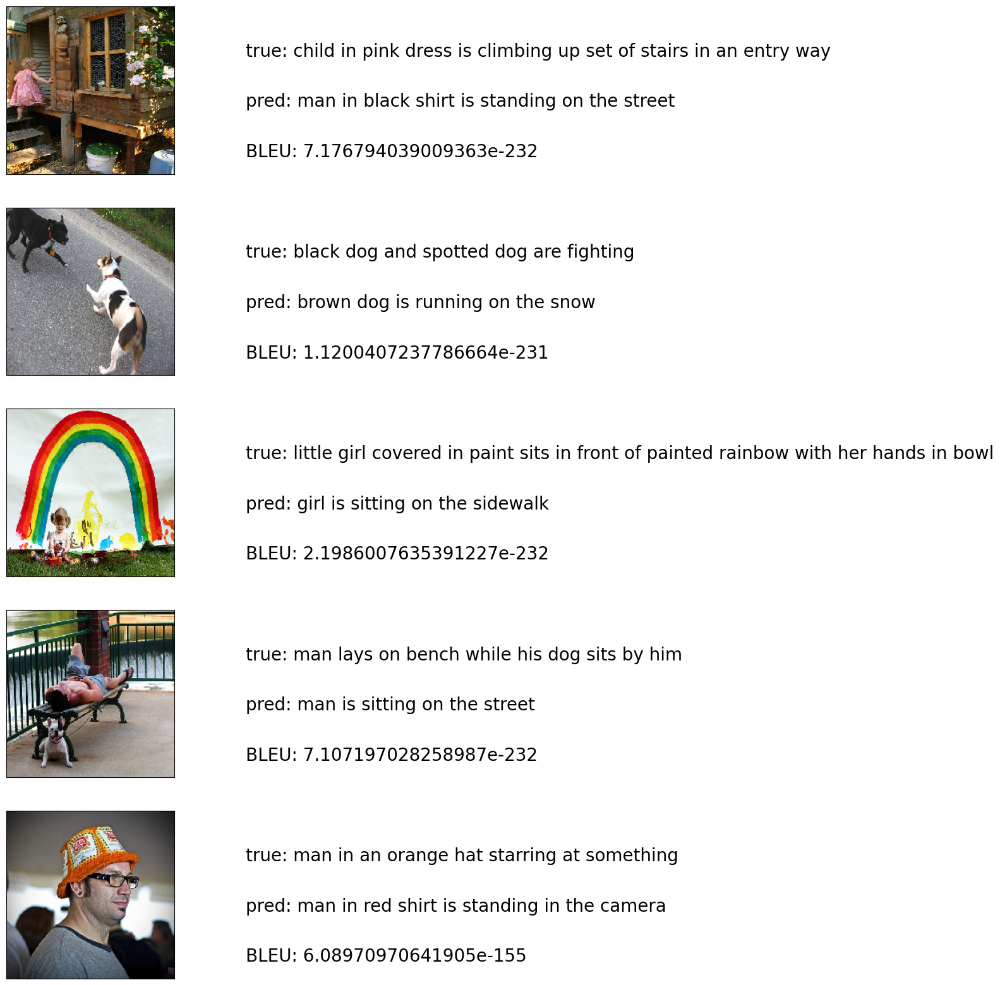

Strong Captions


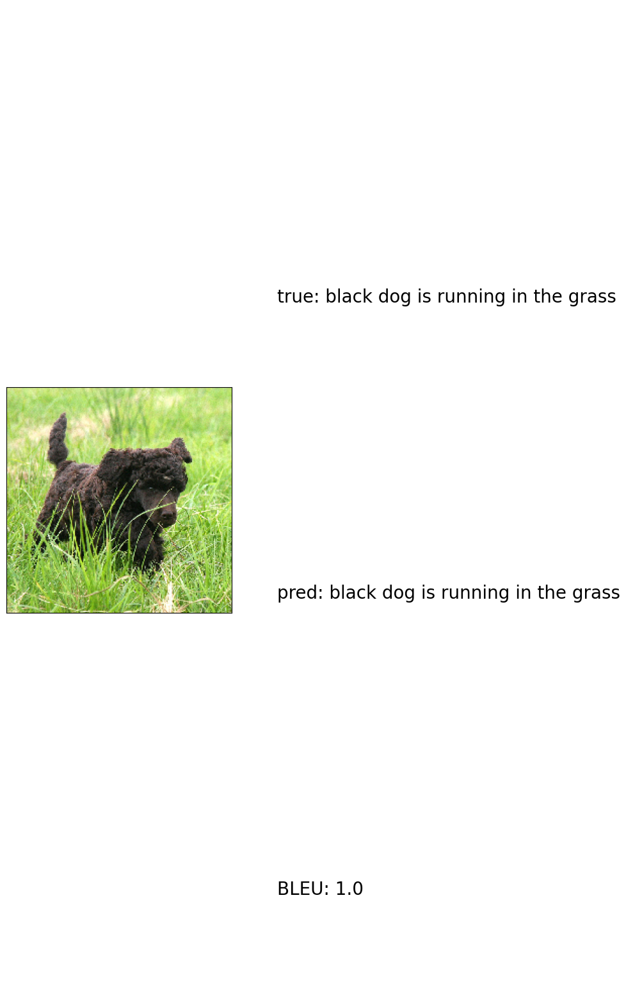

In [ ]:
def plot_images(pred_weak):
    def create_str(caption_true):
        strue = ""
        for s in caption_true:
            strue += " " + s
        return strue
    npix = 224
    target_size = (npix, npix, 3)
    count = 1
    fig = plt.figure(figsize=(10,20))
    npic = len(pred_weak)
    for pw in pred_weak:
        bleu, jpgfnm, caption_true, caption = pw

        filename = dir_Flickr_jpg + '/' + jpgfnm
        image_load = load_img(filename, target_size=target_size)
        ax = fig.add_subplot(npic, 2, count, xticks=[], yticks=[])
        ax.imshow(image_load)
        count += 1

        caption_true = create_str(caption_true)
        caption = create_str(caption)

        ax = fig.add_subplot(npic, 2, count)
        plt.axis('off')
        ax.plot()
        ax.set_xlim(0,1)
        ax.set_ylim(0,1)
        ax.text(0, 0.7, "true:" + caption_true, fontsize=20)
        ax.text(0, 0.4, "pred:" + caption, fontsize=20)
        ax.text(0, 0.1, "BLEU: {}".format(bleu), fontsize=20)
        count += 1
    plt.show()

print("Weak Captions")
plot_images(pred_weak)
print("Strong Captions")
plot_images(pred_strong)